In [1]:
from venim.akatsuki.ir2 import IR2PathManager, IR2FileName

## IR2FileName

Wraps the splitting of the filename into tokens for you and provides them via object attributes.

Has now a good docstring and a nice self display in notebooks, and don't forget that with the Timestamp object in the `datetime` attrtibute you can do time calculations and comparisons for time filtering.

In [2]:
IR2FileName?

Init signature: IR2FileName(fname)
Docstring:     
Class to dismantle an IR2FileName.

Each splittable part of the filename is reachable as a class attribute, and the
datestr and timestr data has been used to create a `pandas.Timestamp`, which can
easily be converted back to a datetime object.

Example
-------
>>> irfn = IR2FileName('ir2_20160829_201008_202_l2b_v10.fit')
>>> irfn.wavelength
202
>>> irfn.datetime
Timestamp('2016-08-29 20:10:08')

Parameters
----------
fname : str
    Akatsuki filename in the format `ir2_20160829_201008_202_l2b_v10.fit`

Attributes
----------
tokens
instr
datestr
date
timestr
time
datetime
wavelength
in_micron
level
version
File:           ~/Dropbox/src/venim/venim/akatsuki/ir2.py
Type:           type
Subclasses:     


In [3]:
irfn = IR2FileName("ir2_20160829_201008_202_l2b_v10.fit")
irfn

IR2 FileName ir2_20160829_201008_202_l2b_v10.fit
DateTime: 2016-08-29 20:10:08
Wavelength: 2.02 micron.
Level: l2b
Version: v10.fit

If you need to filter a list of filenames for wavelength you can just wrap
each into this class and then access the wavelength like so:

In [4]:
irfn.wavelength

'202'

In [5]:
irfn.datetime

Timestamp('2016-08-29 20:10:08')

## IR2PathManager

In [6]:
IR2PathManager?

Init signature: IR2PathManager(level='calibrated', orbit=None, full_paths=False)
Docstring:     
Class to manage files for Akatsuki IR2 data.

Offers method `list_files_for_orbit` to get a list of found files per orbit in
form of a pandas.DataFrame.
Parameters
----------
level : {'raw', 'calibrated', 'geom'}
    Which IR2 data to choose from.
orbit : int, str; optional
    Akatsuki orbit, both revolution string rxxxx and integer number is allowed.
full_paths : bool, optional
    Switch to show full paths on disk.

Attributes
----------
orbit
savedir

Methods
-------
list_files_for_orbit(orbit=None, full_paths=None)
    Get a file listing
File:           ~/Dropbox/src/venim/venim/akatsuki/ir2.py
Type:           type
Subclasses:     


In [7]:
pm = IR2PathManager('calibrated', 25)

In [8]:
pm.orbit

'r0025'

In [9]:
pm.list_files_for_orbit()

,filename,datetime
0,ir2_20160829_201008_202_l2b_v10.fit,2016-08-29 20:10:08
1,ir2_20160825_081015_202_l2b_v10.fit,2016-08-25 08:10:15
2,ir2_20160828_100334_226_l2b_v10.fit,2016-08-28 10:03:34
3,ir2_20160828_180211_174_l2b_v10.fit,2016-08-28 18:02:11
4,ir2_20160827_100211_174_l2b_v10.fit,2016-08-27 10:02:11
...,...,...
243,ir2_20160825_120212_174_l2b_v10.fit,2016-08-25 12:02:12
244,ir2_20160827_141008_202_l2b_v10.fit,2016-08-27 14:10:08
245,ir2_20160829_121007_202_l2b_v10.fit,2016-08-29 12:10:07
246,ir2_20160828_080212_174_l2b_v10.fit,2016-08-28 08:02:12


### getting a path
Instead of copy/paste a filename from above, get the full path from the PathManager.

Use the index number from above pandas.DataFrame. (We can add other methods to get data later).

In [10]:
p = pm.get_path(3)
p

PosixPath('/Users/klay6683/Dropbox/data/venim/akatsuki/ir2/calibrated/r0025/ir2_20160828_180211_174_l2b_v10.fit')

## FITS

The official repository for FITS is now inside the `astropy` project:

In [11]:
from astropy.io import fits

As Eliot pointed out, the fastest way to just get to the image data is using `getdata`:

In [12]:
data = fits.getdata(p)

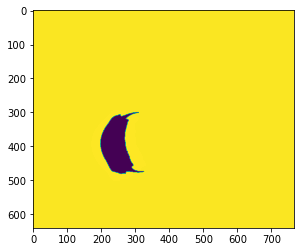

In [13]:
plt.imshow(data)

This data has a lot of negative entries, which must be markers for NaN = Not a Number:

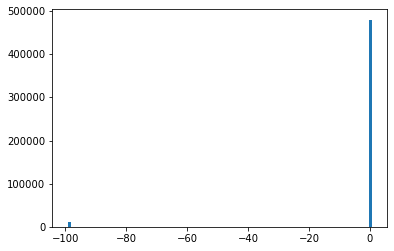

In [14]:
plt.hist(data.flatten(), bins=100);  # using the semicolon here to suppress the printing of matplotlib stuff.

For a quick improvement of image contrast, I'll just set all negative values to 0.

But, as "zero incoming photons" is technically possible for a pixel, to be on the safe side, one could set it to something negative, but much closer to zero, to not skew the image contrast that much:

In [15]:
data.min(), data.max()

(-99.28128, 0.71857285)

It looks like the maximum pixel values are below 1, so doing a minimal -0.01 is good enough, shouldn't affect the contrast, but doesn't mix real data with "bad pixels" either:

In [16]:
data[data<0] = -0.01

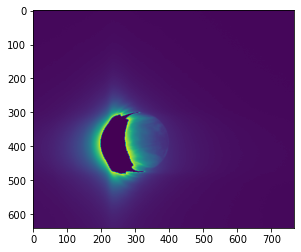

In [17]:
plt.imshow(data)

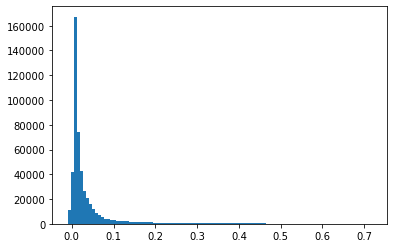

In [18]:
plt.hist(data.flatten(), bins=100);

How many pixels are now "negative", I hear you ask? 

In [19]:
n_bad = data[data<0].shape[0]
n_bad

11464

Total number is (do flatten()) if you don't want to do the math yourself:

In [20]:
n_total = data.flatten().shape[0]
n_total

491520

So, that's a ratio of :

In [21]:
n_bad / n_total

0.023323567708333333

## Full FITS object

Now let's look at what a full FITS object actually is:

In [22]:
fits.open(p)

[<astropy.io.fits.hdu.image.PrimaryHDU object at 0x11f9213a0>, <astropy.io.fits.hdu.image.ImageHDU object at 0x11f911340>]

That's a kind of list (see the brackets []).

It's called a Header Unit list, because each item is a HDU, a HeaDer Unit:

In [23]:
hdul = fits.open(p)

In [24]:
type(hdul)

astropy.io.fits.hdu.hdulist.HDUList

In [25]:
hdul.info()  # use info to get a summary of the HDU list

Filename: /Users/klay6683/Dropbox/data/venim/akatsuki/ir2/calibrated/r0025/ir2_20160828_180211_174_l2b_v10.fit
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      19   ()      
  1  IR2-LEVEL2b    0 ImageHDU       263   (768, 640)   float32   


In [26]:
hdu = hdul[0]  # Let's have a look at the PRIMARY HDU:

In [27]:
hdu.header

SIMPLE  =                    T / conformity to FITS standard                    
BITPIX  =                   16 / number of bits per data pixel                  
NAXIS   =                    0 / number of data axes                            
EXTEND  =                    T / possibility of presence of extensions          
FMTTYPE = 'VCO IMAGE IR2 L2b'  / type of format in FITS file                    
FTYPEVER=           2018061201 / version of FMTTYPE definition                  
ORIGIN  = 'ISAS/JAXA'          / organization responsible for the data          
NEXTEND =                    1 / number of standard extensions                  
TELESCOP= 'VCO     '           / telescope used to acquire data                 
SPCECRFT= 'VCO     '           / name of spacecraft                             
FILENAME= 'ir2_20160828_180211_174_l2b_v10.fit' / original filename             
DATE    = '2019-04-10T23:48:59' / date of file creation in UTC                  
CNTTYPE = 'N/A     '        

These header keywords are all apparently NOT observation related, but relate to the production of the FITS file.

In [28]:
hdu.data

The Primary HDU often has nothing in its `data` attribute, even so it could.

Now, let's look a the Image HDU:

In [29]:
hdu = hdul[1]

In [30]:
hdu

This header is now the full observation header with a lot of metadata for the observation.

In [31]:
hdu.header

XTENSION= 'IMAGE   '           / type of extension                              
BITPIX  =                  -32 / number of bits per data pixel                  
NAXIS   =                    2 / number of data axes                            
NAXIS1  =                  768 / length of data axis 1                          
NAXIS2  =                  640 / length of data axis 2                          
PCOUNT  =                    0 / number of parameters per group                 
GCOUNT  =                    1 / number of groups                               
EXTNAME = 'IR2-LEVEL2b'        / name of this HDU                               
EXTVER  =                    0 / version of the extension                       
ORIGIN  = 'VCO/LEON team'      / organization responsible for the data          
DATE    = '2019-04-10T23:48:59' / date of generation of this HDU in UTC         
DATE-BEG= '2016-08-28T18:01:43.436' / date of the start of observation in UTC   
DATE-OBS= '2016-08-28T18:02:

To get to the value of these keywords, use the header like a Python dictionary:

In [32]:
hdu.header['S_APPDIA']

1.96529

And, at last, the `data` part of the ImageHDU, is the image data in form of a n-dim numpy array:

In [33]:
hdu.data

array([[0.00555371, 0.00435898, 0.00491893, ..., 0.00293926, 0.00276734,
        0.00208554],
       [0.00442586, 0.00490097, 0.00425605, ..., 0.00369331, 0.00245519,
        0.00248111],
       [0.00509356, 0.00500335, 0.00511838, ..., 0.00304325, 0.00304505,
        0.00199867],
       ...,
       [0.01392112, 0.01443662, 0.01360953, ..., 0.00574213, 0.00539422,
        0.00556134],
       [0.01156309, 0.01233186, 0.01203548, ..., 0.00418101, 0.00429164,
        0.00389776],
       [0.01418341, 0.01301778, 0.01439833, ..., 0.00491249, 0.00641141,
        0.00592858]], dtype=float32)

In [34]:
hdu.data.shape

(640, 768)

The FITS shortcut `getdata` also provides the observational header, if you use the `header=True` keyword argument:

In [35]:
d, h = fits.getdata(p, header=True)

In [36]:
d.shape

(640, 768)

In [37]:
print(list(h.keys()))  # This is all the header keywords printed as a list

['XTENSION', 'BITPIX', 'NAXIS', 'NAXIS1', 'NAXIS2', 'PCOUNT', 'GCOUNT', 'EXTNAME', 'EXTVER', 'ORIGIN', 'DATE', 'DATE-BEG', 'DATE-OBS', 'DATE-END', 'TELESCOP', 'SPCECRFT', 'INSTRUME', 'OBJECT', 'BUNIT', 'DATAMAX', 'DATAMIN', 'P_L0NAME', 'P_MPIXV', 'P_MPIXN', 'P_DPIXV', 'P_DPIXN', 'P_SPIXO', 'P_SPIXV', 'P_SPIXN', 'P_MEAN', 'P_STDDEV', 'COMMENT', 'COMMENT', 'COMMENT', 'EXPOSURE', 'FILTER', 'P_ID', 'P_FLTCW', 'P_FLTBW', 'P_FLTAT', 'P_BINN', 'P_POSLLX', 'P_POSLLY', 'P_POSURX', 'P_POSURY', 'P_FLPROT', 'P_OPOSX1', 'P_OPOSY1', 'P_OPOSX2', 'P_OPOSY2', 'P_OPOSX3', 'P_OPOSY3', 'P_OPOSX4', 'P_OPOSY4', 'COMMENT', 'COMMENT', 'COMMENT', 'P_CMPSTY', 'P_CMPTYP', 'P_CMPPAR', 'P_IMGERR', 'COMMENT', 'COMMENT', 'COMMENT', 'P_SCCSC', 'P_SCCEC', 'COMMENT', 'COMMENT', 'COMMENT', 'P_DVER', 'COMMENT', 'COMMENT', 'COMMENT', 'I2_HTON', 'I2_HTENA', 'I2_CLENA', 'I2_CLON', 'I2_CLBRT', 'I2_GAIN', 'I2_LEDON', 'I2_P1ACK', 'I2_P2ACK', 'I2_FWROT', 'COMMENT', 'COMMENT', 'COMMENT', 'I2_IMGNM', 'I2_T_C1', 'I2_T_C2', 'I2_T_O

If you set things up with plotting to your liking with matplotlib, you should be able to have the plot window pop out of the notebook, but I can't help you there, as I don't do that anymore for many years. I rather have a dynamic object that I can manipulate exactly where I am working.

Part of a newer plotting philosophy that creates re-usable and expandable plot-able objects is the `holoviews` project. (See holoviews.org). This project is part of a huge effort in bringing Python plotting into the next century, which you can check out at holoviz.org, where several tools are offered, each addressing slightly different needs, e.g. plotting GBytes of data at once (=datashader), and `panel` which enables you to create interactive web-apps from your data.

Here's plotting an image using holoviews

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
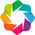

In [38]:
import holoviews as hv

hv.notebook_extension('bokeh')

Note: if you don't have holoviews installed (I'm not sure it's part of the `anaconda` meta-package list, do

```bash
conda install holoviews
```

and all should be taken care of.

In [39]:
imgplot = hv.Raster(data).opts(cmap='gray', width=500, height=500)

In [40]:
imgplot

:Raster   [x,y]   (z)